In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

In [2]:
df1 = pd.read_csv('/house-prices-advanced-regression-techniques/test_processed.csv')
df = pd.read_csv('/house-prices-advanced-regression-techniques/train_processed.csv')

In [3]:
df.shape, df1.shape

((1460, 81), (1459, 80))

In [4]:
num = []
cat = []
for i in df.columns:
    if (df[i].dtype.name == 'object') | (df[i].dtype.name == 'bool'):
        cat.append(i)
    else :
        num.append(i)

In [5]:
corr_mat = df.corrwith(df['SalePrice']).sort_values(ascending = False) 
corr_mat

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
MasVnrArea       0.472614
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.334771
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
GarageYrBlt      0.261366
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
dtype: float

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37]),
 <a list of 38 Text xticklabel objects>)

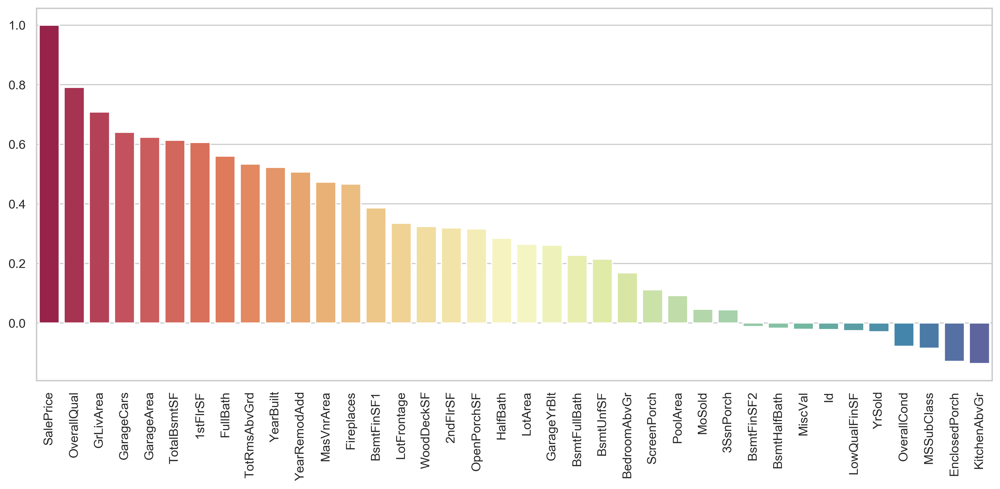

In [6]:
plt.figure(figsize = (15,6), dpi = 300)
sns.barplot(corr_mat.index, corr_mat, palette="Spectral")
plt.xticks(rotation=90)

In [7]:
plt.figure(figsize=[30,25], dpi = 500)
sns.heatmap(df.corr(),annot = True,cmap ='BrBG', linecolor = 'white', linewidth = 2)
plt.savefig(fname = 'heatmap', dpi=500)

In [8]:
# Taking data with corr more than 0.4
x = []
for i in corr_mat.index:
    if corr_mat[i]>0.5:
        x.append(i) 


In [9]:
x

['SalePrice',
 'OverallQual',
 'GrLivArea',
 'GarageCars',
 'GarageArea',
 'TotalBsmtSF',
 '1stFlrSF',
 'FullBath',
 'TotRmsAbvGrd',
 'YearBuilt',
 'YearRemodAdd']

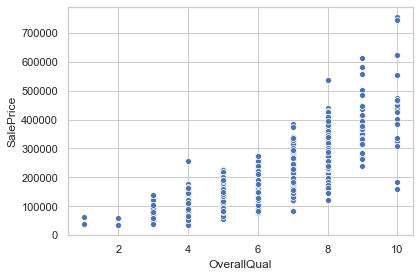

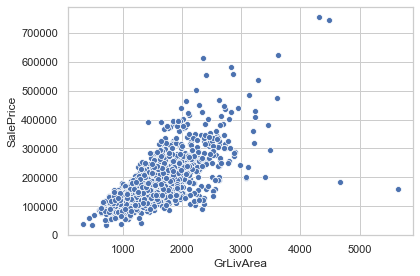

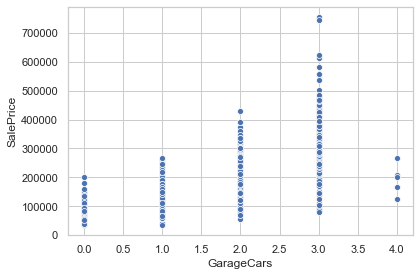

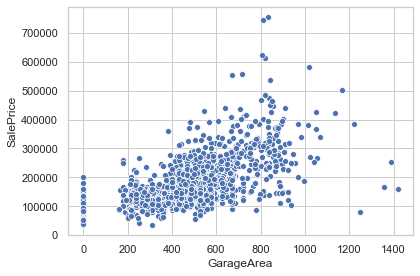

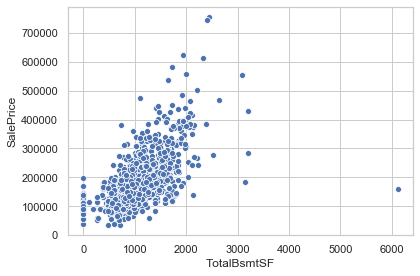

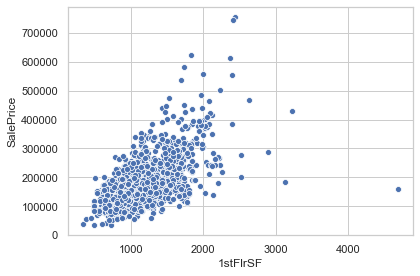

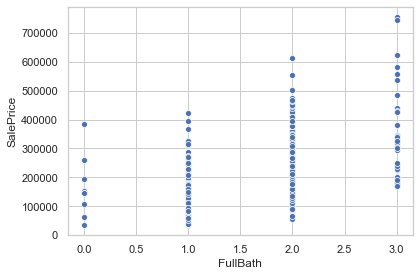

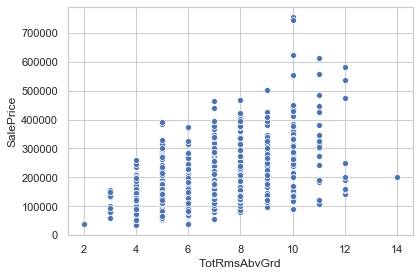

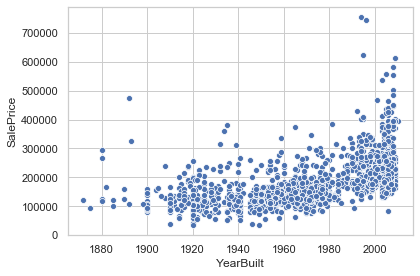

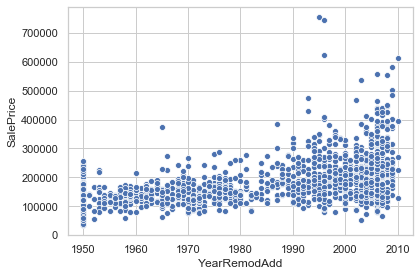

In [10]:
for i in x[1:]:
    plt.figure(figsize =(6,4)) 
    ax = sns.scatterplot(df[i],df['SalePrice'])
    plt.tight_layout()

In [11]:
#df.drop(df[(df['OverallQual']<5) & (df['SalePrice']>200000)].index, inplace=True)
#df.drop(df[(df['OverallQual']<8) & (df['SalePrice']>500000)].index, inplace=True)
#df.drop(df[(df['OverallQual']>9) & (df['SalePrice']<200000)].index, inplace=True)

df.drop(df[(df['GrLivArea']>4000) & (df['SalePrice']<200000)].index, inplace=True)
#df.drop(df[(df['GrLivArea']>4000) & (df['SalePrice']>700000)].index, inplace=True)

df.drop(df[(df['TotalBsmtSF']>4000)].index, inplace=True)

df.drop(df[(df['1stFlrSF']>3000)].index, inplace=True)

df.drop(df[(df['YearBuilt']<1980) & (df['SalePrice']>400000)].index, inplace=True)

df.drop(df[(df['YearRemodAdd']<1980) & (df['SalePrice']>300000)].index, inplace=True)

In [12]:
df_feat = df[x]
df1_feat = df1[x[1:]]

<Figure size 15000x12500 with 0 Axes>

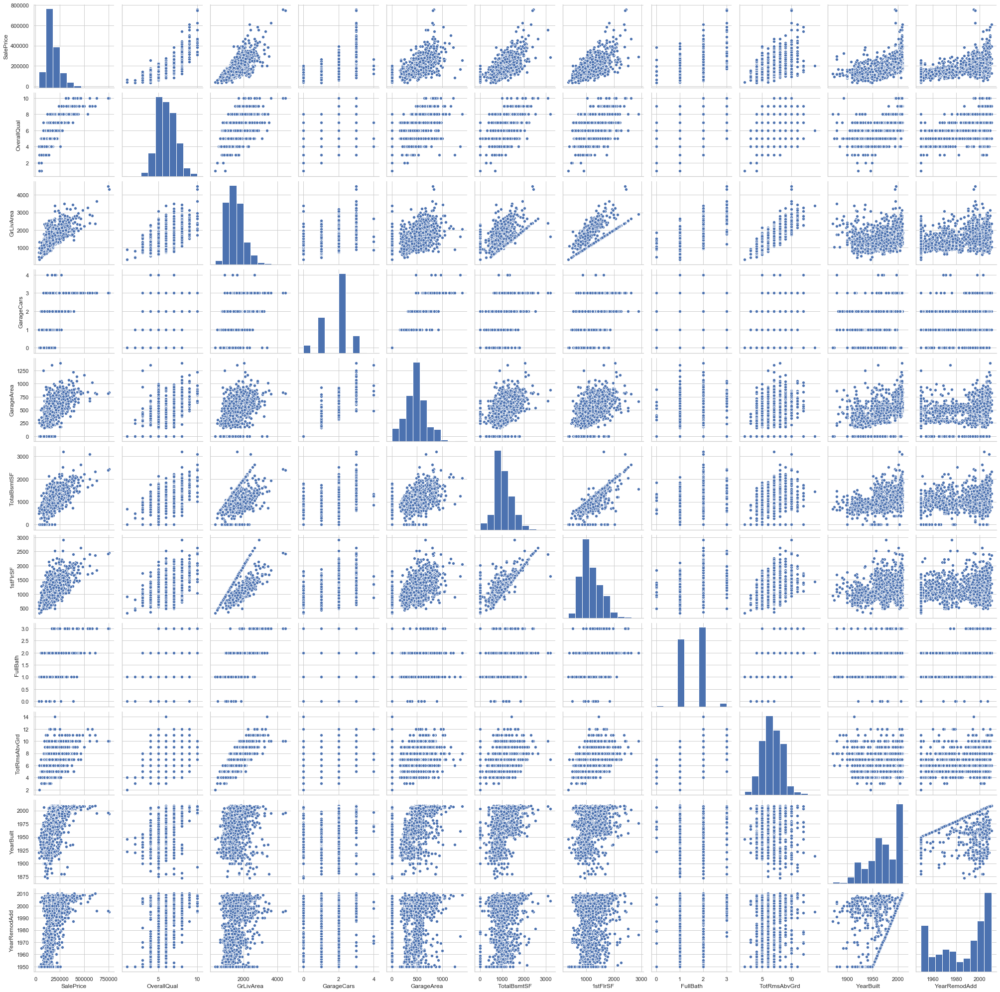

In [13]:
plt.figure(figsize=[30,25], dpi = 500)
sns.pairplot(df_feat)
plt.savefig(fname = 'pairplot_corr', dpi=500)

In [14]:
df_feat.shape, df1_feat.shape

((1455, 11), (1459, 10))

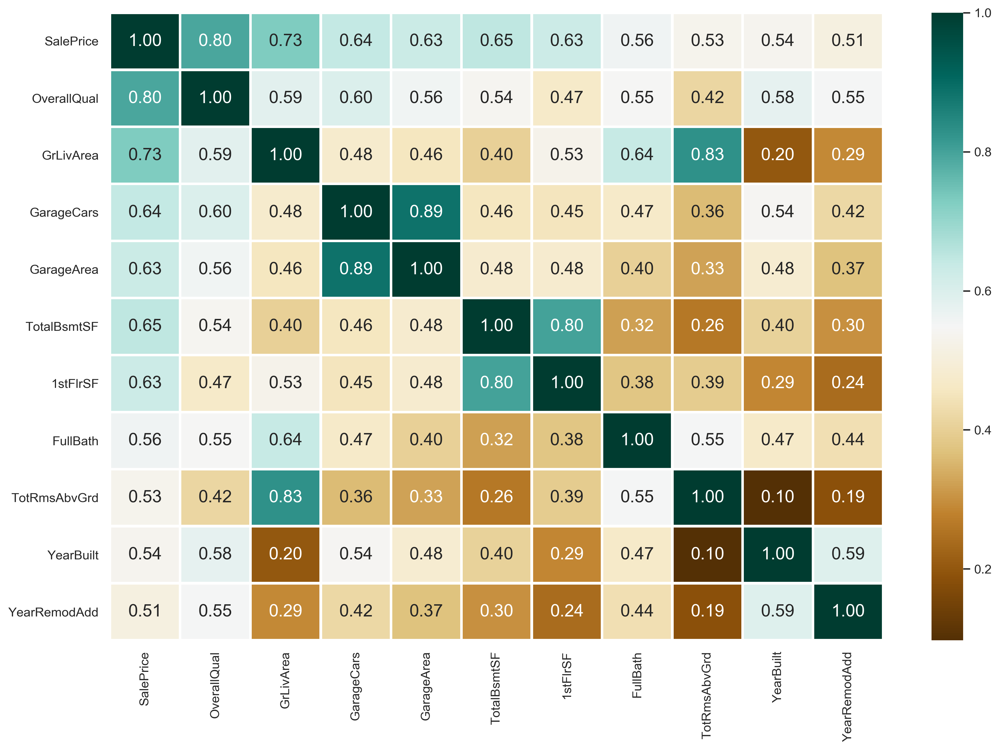

In [15]:
plt.figure(figsize=[15,10], dpi = 300)
sns.heatmap(df_feat.corr(), annot = True, linecolor = 'white', cmap ='BrBG', linewidth = 2, fmt='.2f', annot_kws={'size':15})
plt.savefig(fname = 'heatmap_corr', dpi=300)

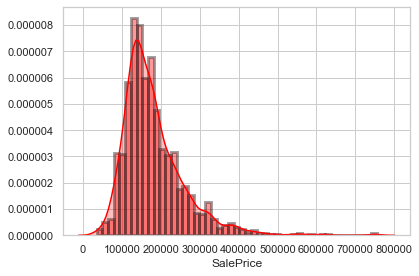

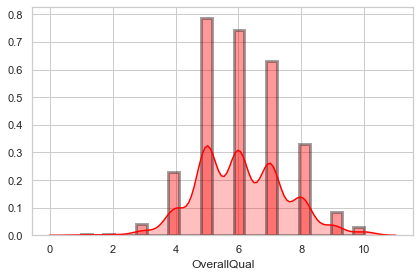

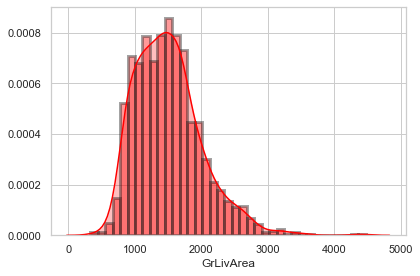

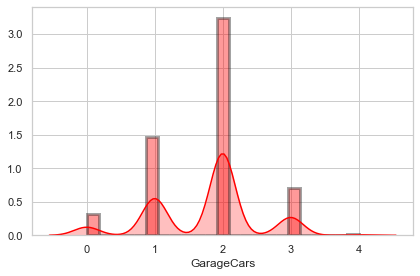

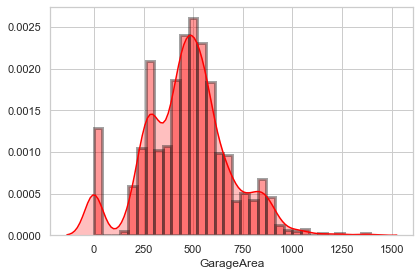

...

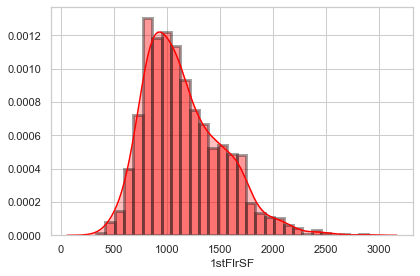

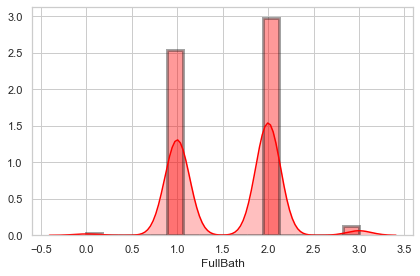

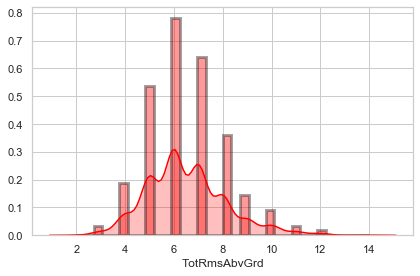

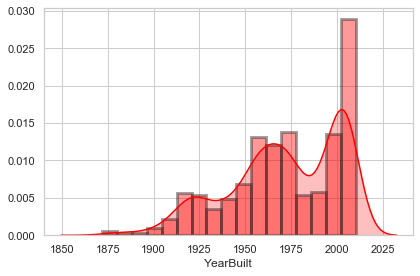

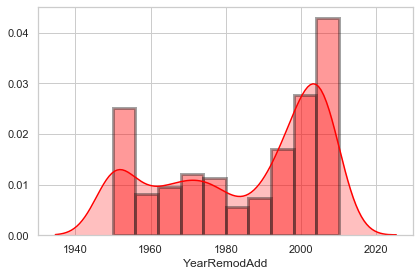

In [16]:
for i in df_feat.columns:
    plt.figure(figsize =(6,4)) 
    ax = sns.distplot(df_feat[i], hist=True, color="red", kde = True,kde_kws={"shade": True}, hist_kws = dict(edgecolor="k", linewidth=3))
    plt.tight_layout()

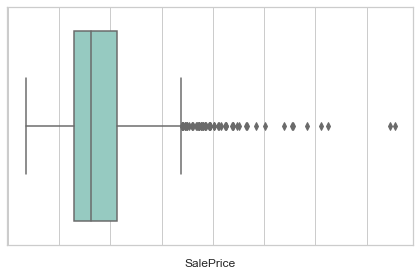

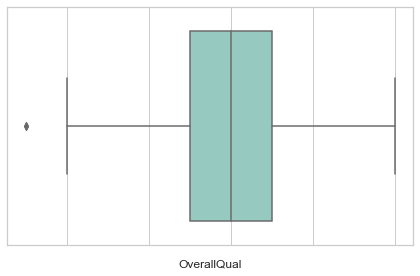

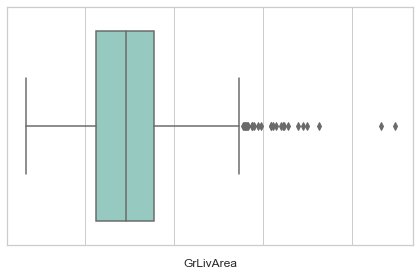

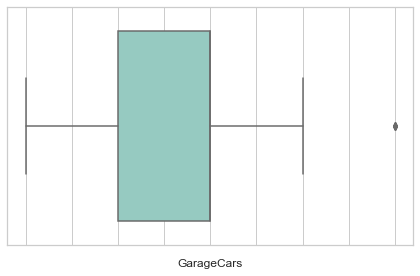

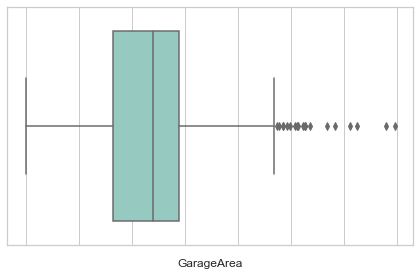

...

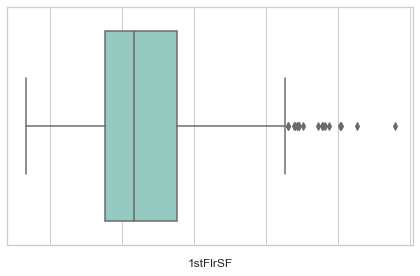

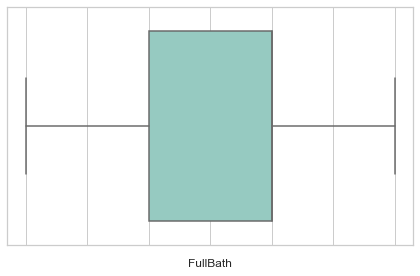

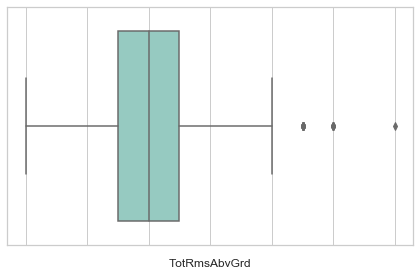

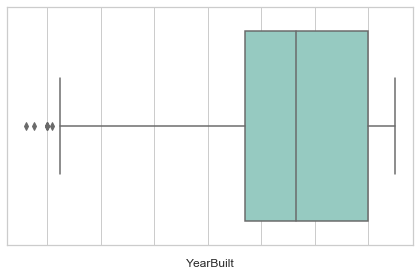

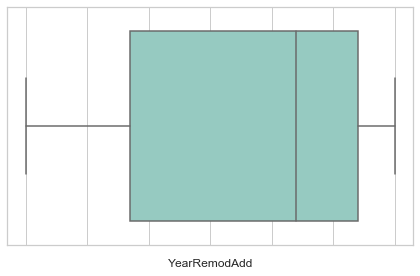

In [17]:
for i in df_feat.columns:
    plt.figure(figsize =(6,4)) 
    ax = sns.boxplot(df_feat[i],palette = 'Set3')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    plt.tight_layout()

C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.

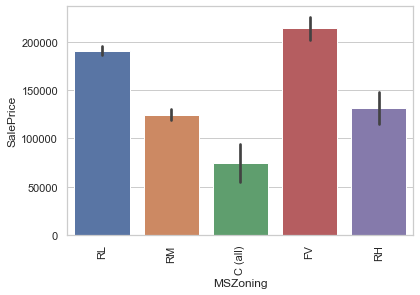

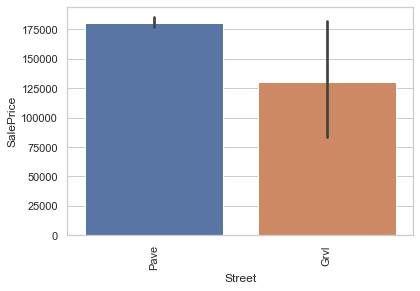

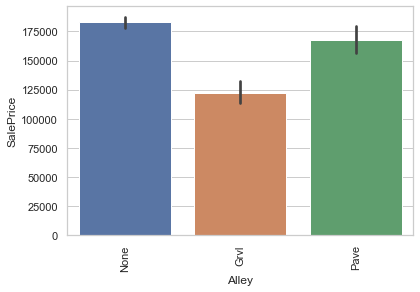

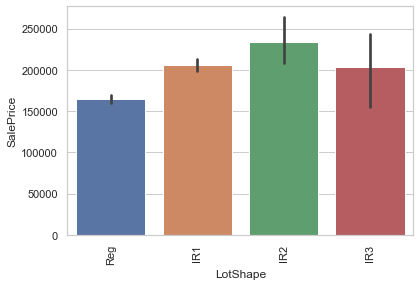

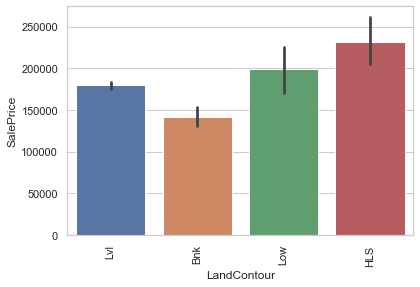

...

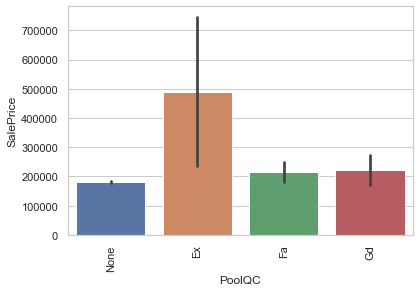

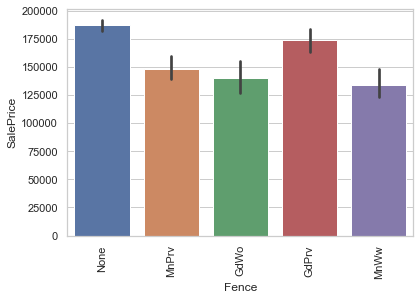

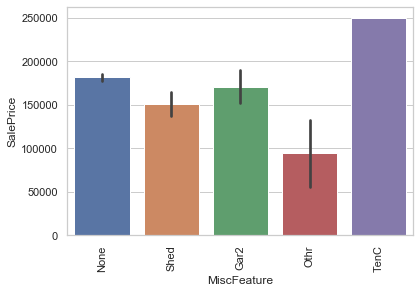

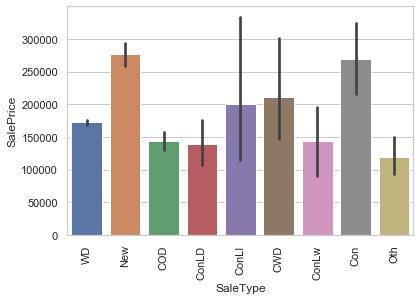

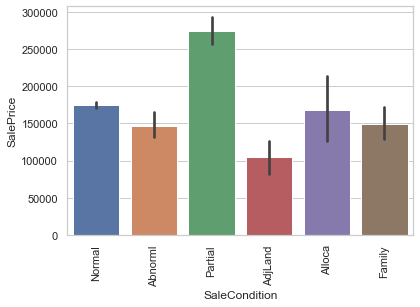

In [19]:
for i in df[cat].columns:
    plt.figure(figsize =(6,4)) 
    ax = sns.barplot(df[i],df['SalePrice'])
    plt.tight_layout()
    ax.set_xticklabels(ax.get_xticklabels(),rotation = 90)

In [20]:
# Num feats transforming
# square rooting the area feats
for i in ['GrLivArea','GarageArea','TotalBsmtSF','1stFlrSF']:#MasVnrArea
    df_feat[i] = np.sqrt(df_feat[i])
for i in ['GrLivArea','GarageArea','TotalBsmtSF','1stFlrSF']:#MasVnrArea
    df1_feat[i] = np.sqrt(df1_feat[i])

C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [21]:
#year feats
for i in ['YearBuilt','YearRemodAdd']:
    df_feat[i] = df_feat[i].apply(lambda x: 2010- x) 
for i in ['YearBuilt','YearRemodAdd']:
    df1_feat[i] = df1_feat[i].apply(lambda x: 2010 - x) 

C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [22]:
# Num feats transforming
# reducing the skewness
for i in ['GrLivArea','GarageArea','TotalBsmtSF','1stFlrSF','YearRemodAdd','YearBuilt']:#MasVnrArea
    df_feat[i] = np.log1p(df_feat[i])
for i in ['GrLivArea','GarageArea','TotalBsmtSF','1stFlrSF','YearRemodAdd','YearBuilt']:#MasVnrArea
    df1_feat[i] = np.log1p(df1_feat[i])

C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\Balaji\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [23]:
df_feat.shape,df1_feat.shape

((1455, 11), (1459, 10))

In [26]:
# cat feats processing
# dummy feats
ds = pd.concat([df[cat], df1[cat]], sort=False) 

for i in cat:
    dummy = pd.get_dummies(ds[i], prefix = i, drop_first = True)
    ds = pd.concat([ds,dummy], axis= 1)

df_feats = ds.iloc[:1455, 43:]
df1_feats = ds.iloc[1455:,43:]  

df_train = pd.concat([df_feat,df_feats], axis= 1)
df_test = pd.concat([df1_feat,df1_feats], axis= 1)


In [27]:

df_train.to_csv('/house-prices-advanced-regression-techniques/train_final.csv',index =False)
df_test.to_csv('/house-prices-advanced-regression-techniques/test_final.csv',index =False)
